<a href="https://colab.research.google.com/github/ebapudeogracious/BSG_gis/blob/main/project.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!pip install geopandas

In [ ]:
import geopandas as gpd

In [ ]:
file_name = "ugandadistricts.geojson"
data=gpd.read_file("ugandadistricts.geojson")

In [ ]:
data.head(112)

In [ ]:
data["Shape_Area"]=data.Shape_Area

In [ ]:
data=data.set_index("Subregion")
data["Shape_Area"]=data.Shape_Area

In [ ]:
data.plot("Shape_Area",legend=True)

In [ ]:
!pip install mapclassify

In [ ]:
data.explore("Shape_Area",legend=True)

In [ ]:
#quantitative analysis using describe function
data.describe()

,OBJECTID,DCODE2014,Households,Population,Urban_2014,Shape_Leng,Shape_Area
count,112.0,112.000000,112.000000,1.120000e+02,1.120000e+02,112.000000,1.120000e+02
mean,0.0,266.464286,65231.133929,3.092379e+05,6.630236e+04,251029.279959,2.155828e+09
std,0.0,107.830191,63517.858735,2.522037e+05,1.795179e+05,97864.313150,1.673161e+09
min,0.0,101.000000,13942.000000,5.429300e+04,2.952000e+03,70620.094362,1.951377e+08
25%,0.0,204.750000,34138.000000,1.771300e+05,1.381050e+04,170529.511691,8.625475e+08
50%,0.0,266.500000,47723.500000,2.397045e+05,2.804050e+04,245589.083497,1.660255e+09
75%,0.0,328.250000,76719.000000,3.893660e+05,5.843700e+04,316308.957575,3.252274e+09
max,0.0,426.000000,502089.000000,1.997418e+06,1.507080e+06,498394.891015,9.611981e+09


In [ ]:
#Qualitatve analysis using info function
data.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
Index: 112 entries, KARAMOJA to WEST NILE
Data columns (total 10 columns):
 #   Column      Non-Null Count  Dtype   
---  ------      --------------  -----   
 0   OBJECTID    112 non-null    int64   
 1   DCODE2014   112 non-null    float64 
 2   DNAME2014   112 non-null    object  
 3   Region      112 non-null    object  
 4   Households  112 non-null    float64 
 5   Population  112 non-null    float64 
 6   Urban_2014  112 non-null    float64 
 7   Shape_Leng  112 non-null    float64 
 8   Shape_Area  112 non-null    float64 
 9   geometry    112 non-null    geometry
dtypes: float64(6), geometry(1), int64(1), object(2)
memory usage: 13.7+ KB


In [ ]:
#projection
data.crs

<Geographic 2D CRS: EPSG:4326>
Name: WGS 84
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: World.
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984 ensemble
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

In [ ]:
# correlation matrix using corr
correlation_matrix=data[["Households","Population","Urban_2014"]].corr()
print(correlation_matrix)

            Households  Population  Urban_2014
Households    1.000000    0.986602    0.890176
Population    0.986602    1.000000    0.827821
Urban_2014    0.890176    0.827821    1.000000


<Axes: title={'center': 'CORRELATION MATRIX'}>

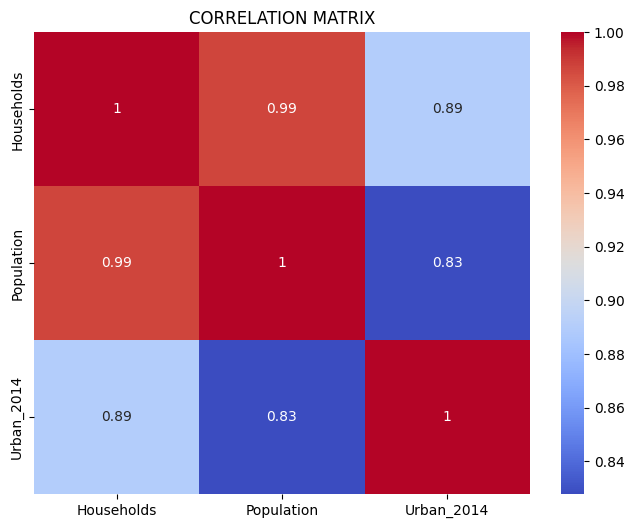

In [ ]:
#plotting the correlation matrix
import seaborn as sbn
import matplotlib.pyplot as plt


plt.figure(figsize=(8,6))
plt.title("CORRELATION MATRIX")
sbn.heatmap(correlation_matrix, annot=True,cmap="coolwarm")

In [ ]:
import numpy as np
from sklearn.linear_model import LinearRegression

# generate some example data
x = np.array([1,2,3,4,5]).reshape((-1,1))
y=np.array([2,3,4,5,6])

#create a linear regression object
model=LinearRegression()

# Fit the model to the data
model.fit(x,y)

#print the model coefficients
print('Intercept:',model.intercept_)
print('slope:',model.coef_)

Intercept: 1.0
slope: [1.]


In [ ]:
# make a prediction in a new data point
x_new= np.array([6]).reshape((-1,1))
y_new=model.predict(x_new)
print('predict for x=6:',y_new)

predict for x=6: [7.]


In [ ]:
#importing numpy library
import numpy as np

In [ ]:
#defining data
from sklearn import datasets
X = np.array(['Households''Urban_2014']).reshape((-1,1))
Y = np.array(['Population'])

In [ ]:
# data splitting into training and testing dataset
from sklearn.model_selection import train_test_split

X = data[['Households']]
Y = data['Population']

X_train, X_test, y_train, y_test = train_test_split (X,Y, train_size=0.8, test_size=0.2, random_state=1)

In [ ]:
# data splitting into training and testing dataset
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X,Y, train_size=0.8, test_size=0.2, random_state=1)